In [2]:
import os
import json
import cv2

import pandas as pd
import numpy as np

from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [3]:
img = cv2.imread('data/train/0030fd0e6378.png')

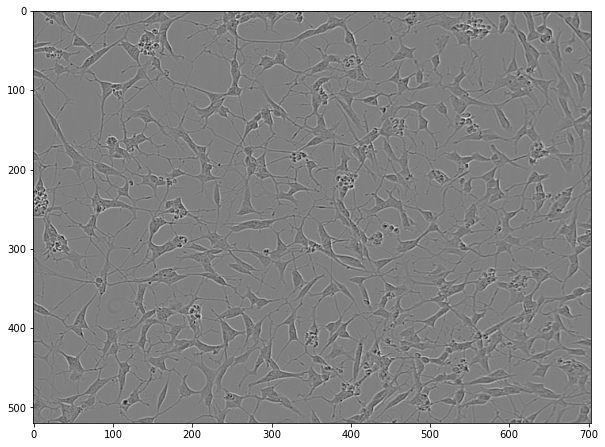

In [4]:
plt.figure(figsize=(10, 10))
plt.imshow(img)

In [9]:
img = cv2.imread('data/LIVECell_dataset_2021/images/livecell_train_val_images/A172/A172_Phase_A7_1_00d00h00m_1.tif')

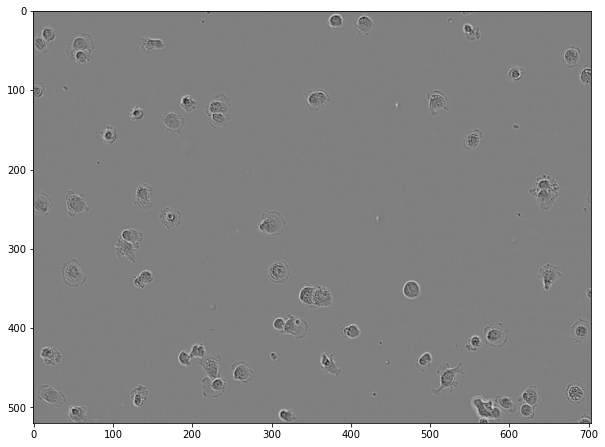

In [10]:
plt.figure(figsize=(10, 10))
plt.imshow(img)

In [11]:
train_df = pd.read_csv('data/train.csv')

In [13]:
train_df['annotation']

0        118145 6 118849 7 119553 8 120257 8 120961 9 1...
1        189036 1 189739 3 190441 6 191144 7 191848 8 1...
2        173567 3 174270 5 174974 5 175678 6 176382 7 1...
3        196723 4 197427 6 198130 7 198834 8 199538 8 2...
4        167818 3 168522 5 169225 7 169928 8 170632 9 1...
                               ...                        
73580    3610 3 4311 7 5014 9 5717 11 6420 13 7123 15 7...
73581    341585 2 342287 5 342988 10 343690 13 344394 1...
73582    47788 3 48490 7 49192 11 49896 13 50599 14 513...
73583    333290 1 333993 2 334696 4 335399 5 336102 6 3...
73584    249775 2 250477 6 251180 8 251882 11 252585 12...
Name: annotation, Length: 73585, dtype: object

In [15]:
train_df.head().T

,0,1,2,3,4
id,0030fd0e6378,0030fd0e6378,0030fd0e6378,0030fd0e6378,0030fd0e6378
annotation,118145 6 118849 7 119553 8 120257 8 120961 9 1...,189036 1 189739 3 190441 6 191144 7 191848 8 1...,173567 3 174270 5 174974 5 175678 6 176382 7 1...,196723 4 197427 6 198130 7 198834 8 199538 8 2...,167818 3 168522 5 169225 7 169928 8 170632 9 1...
width,704,704,704,704,704
height,520,520,520,520,520
cell_type,shsy5y,shsy5y,shsy5y,shsy5y,shsy5y
plate_time,11h30m00s,11h30m00s,11h30m00s,11h30m00s,11h30m00s
sample_date,2019-06-16,2019-06-16,2019-06-16,2019-06-16,2019-06-16
sample_id,shsy5y[diff]_E10-4_Vessel-714_Ph_3,shsy5y[diff]_E10-4_Vessel-714_Ph_3,shsy5y[diff]_E10-4_Vessel-714_Ph_3,shsy5y[diff]_E10-4_Vessel-714_Ph_3,shsy5y[diff]_E10-4_Vessel-714_Ph_3
elapsed_timedelta,0 days 11:30:00,0 days 11:30:00,0 days 11:30:00,0 days 11:30:00,0 days 11:30:00


In [17]:
train_df['annotation'].loc[0]

'118145 6 118849 7 119553 8 120257 8 120961 9 121665 10 122369 12 123074 13 123778 14 124482 15 125186 16 125890 17 126594 18 127298 19 128002 20 128706 21 129410 22 130114 23 130818 24 131523 24 132227 25 132931 25 133635 24 134339 24 135043 23 135748 21 136452 19 137157 16 137864 11 138573 4'

In [19]:
train_df['cell_type'].value_counts()

shsy5y    52286
cort      10777
astro     10522
Name: cell_type, dtype: int64

In [21]:
from datetime import datetime

In [20]:
train_df['plate_time']

0        11h30m00s
1        11h30m00s
2        11h30m00s
3        11h30m00s
4        11h30m00s
           ...    
73580    11h59m00s
73581    11h59m00s
73582    11h59m00s
73583    11h59m00s
73584    11h59m00s
Name: plate_time, Length: 73585, dtype: object

In [28]:
train_df['plate_time'] = train_df['plate_time'].apply(lambda x: datetime.strptime(x, '%Hh%Mm%Ss'))

In [33]:
train_df['sample_date'] = train_df['sample_date'].apply(lambda x: datetime.strptime(x, '%Y-%m-%d')) 

In [40]:
train_df['elapsed_days'] = train_df['elapsed_timedelta'].apply(lambda x: x.split()[0])

In [45]:
train_df['elapsed_days'] = train_df['elapsed_timedelta'].apply(lambda x: datetime.strptime(x.split()[-1], '%H:%M:%S'))

In [42]:
train_df['elapsed_days'].value_counts()

0    73585
Name: elapsed_days, dtype: int64

In [47]:
train_df['plate_time'].value_counts()

1900-01-01 11:30:00    52286
1900-01-01 09:00:00     6462
1900-01-01 13:30:00     5704
1900-01-01 13:00:00     4060
1900-01-01 19:30:00     2130
1900-01-01 11:59:00     1292
1900-01-01 07:30:00      923
1900-01-01 01:30:00      728
Name: plate_time, dtype: int64

In [51]:
train_df[train_df['plate_time'] == datetime.strptime('01:30:00', '%H:%M:%S')]

,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta,elapsed_days
1924,0728b8f39241,250406 7 251109 9 251811 11 252514 13 253217 1...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B6-1_Vessel-377_Ph_4,0 days 01:30:00,1900-01-01 01:30:00
1925,0728b8f39241,202120 3 202822 8 203523 13 204226 16 204929 1...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B6-1_Vessel-377_Ph_4,0 days 01:30:00,1900-01-01 01:30:00
1926,0728b8f39241,319606 11 320309 12 321011 14 321714 15 322418...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B6-1_Vessel-377_Ph_4,0 days 01:30:00,1900-01-01 01:30:00
1927,0728b8f39241,80209 3 80911 7 81612 12 82314 15 83016 17 837...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B6-1_Vessel-377_Ph_4,0 days 01:30:00,1900-01-01 01:30:00
1928,0728b8f39241,40644 8 41347 11 42049 14 42752 16 43456 16 44...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B6-1_Vessel-377_Ph_4,0 days 01:30:00,1900-01-01 01:30:00
...,...,...,...,...,...,...,...,...,...,...
72158,f6e7e998a190,58888 7 59590 10 60289 16 60993 17 61696 18 62...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B5-4_Vessel-377_Ph_1,0 days 01:30:00,1900-01-01 01:30:00
72159,f6e7e998a190,283099 15 283800 20 284504 20 285207 21 285911...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B5-4_Vessel-377_Ph_1,0 days 01:30:00,1900-01-01 01:30:00
72160,f6e7e998a190,99469 1 100172 4 100876 5 101579 7 102282 8 10...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B5-4_Vessel-377_Ph_1,0 days 01:30:00,1900-01-01 01:30:00
72161,f6e7e998a190,230969 6 231671 8 232373 11 233074 14 233776 1...,704,520,cort,1900-01-01 01:30:00,2020-11-05,cort[oka-high]_B5-4_Vessel-377_Ph_1,0 days 01:30:00,1900-01-01 01:30:00


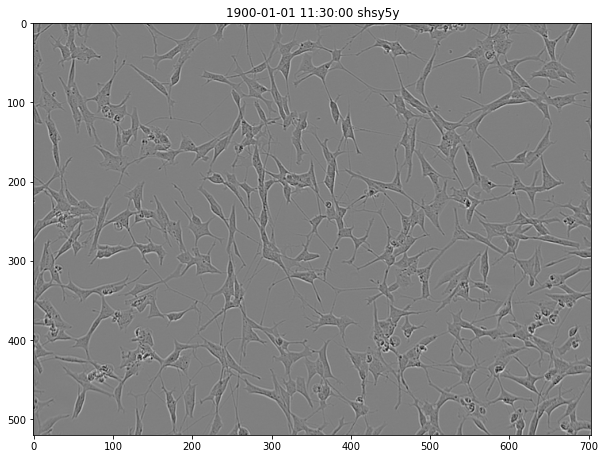

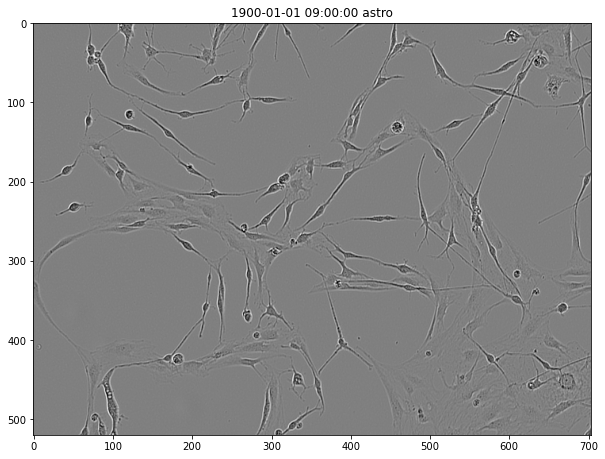

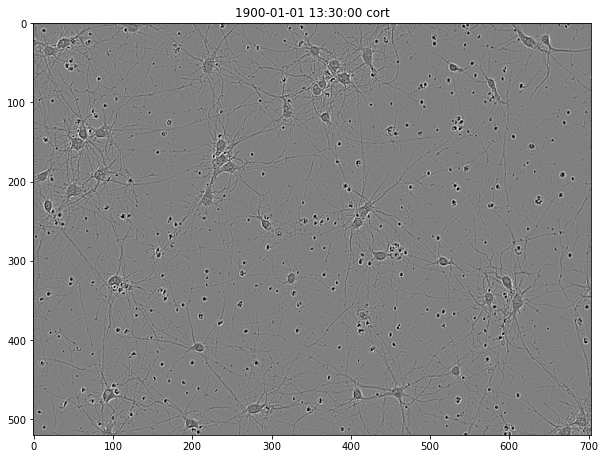

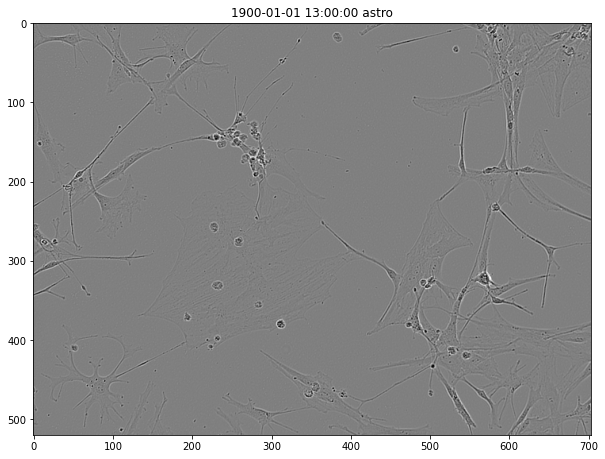

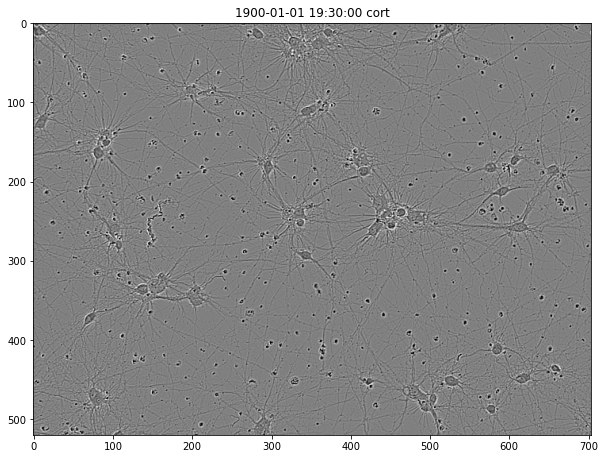

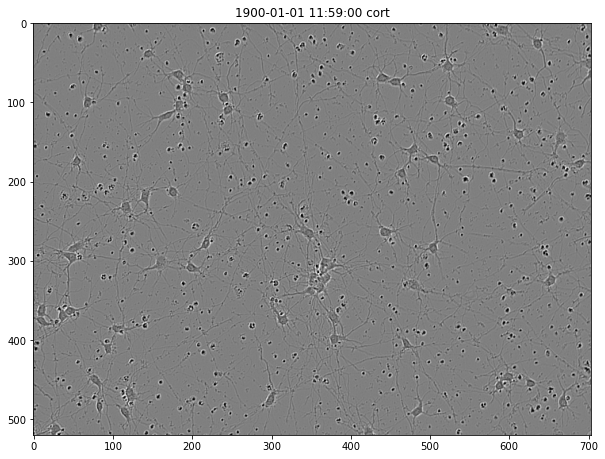

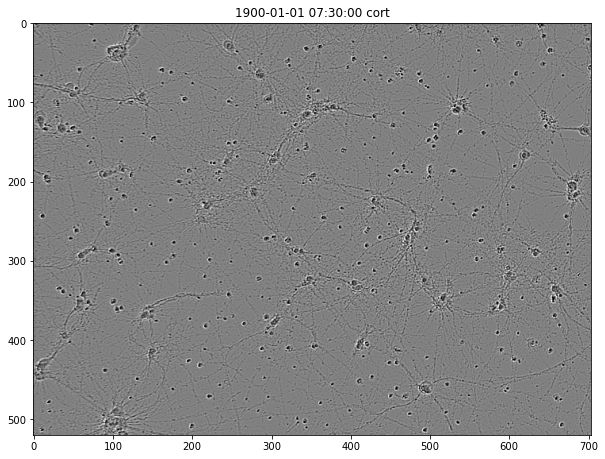

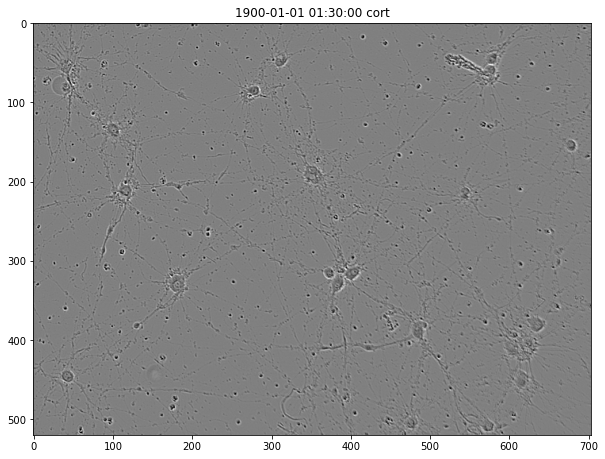

In [75]:
for plate_time in train_df['plate_time'].value_counts().index:
    values = train_df[train_df['plate_time'] == plate_time].sample(1).iloc[0]
    img_id = values['id']
    cell_type = values['cell_type']
    img = cv2.imread(f'data/train/{img_id}.png')
    plt.figure(figsize=(10, 10))
    plt.title(f'{plate_time} {cell_type}')
    plt.imshow(img)
    plt.show()

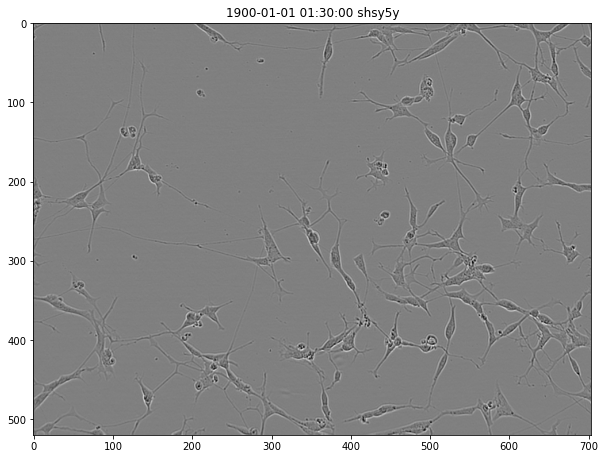

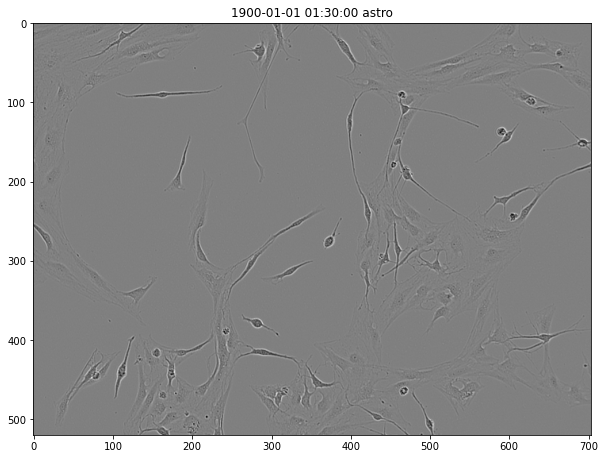

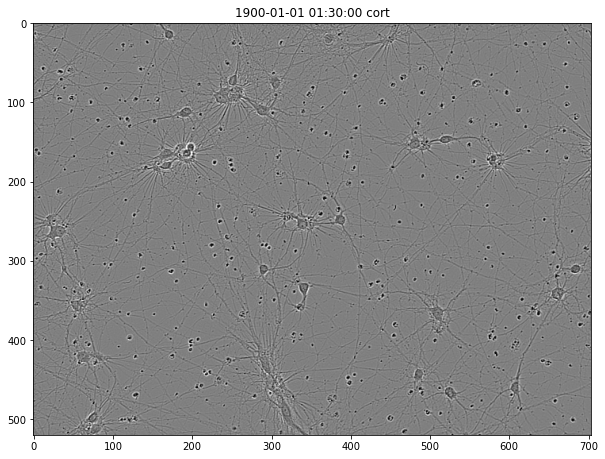

In [78]:
for cell_type in train_df['cell_type'].unique():
    values = train_df[train_df['cell_type'] == cell_type].sample(1).iloc[0]
    img_id = values['id']
    cell_type = values['cell_type']
    img = cv2.imread(f'data/train/{img_id}.png')
    plt.figure(figsize=(10, 10))
    plt.title(f'{plate_time} {cell_type}')
    plt.imshow(img)
    plt.show()

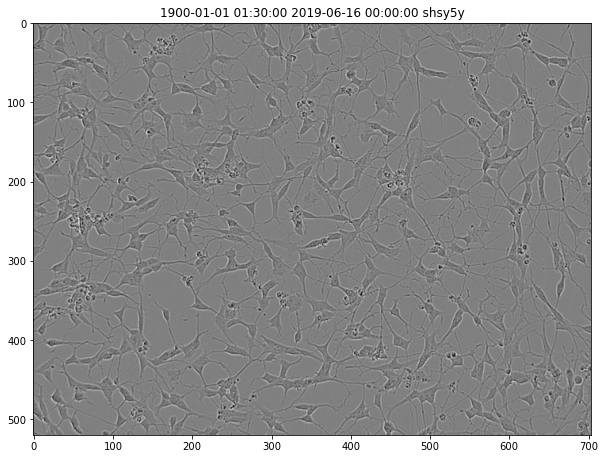

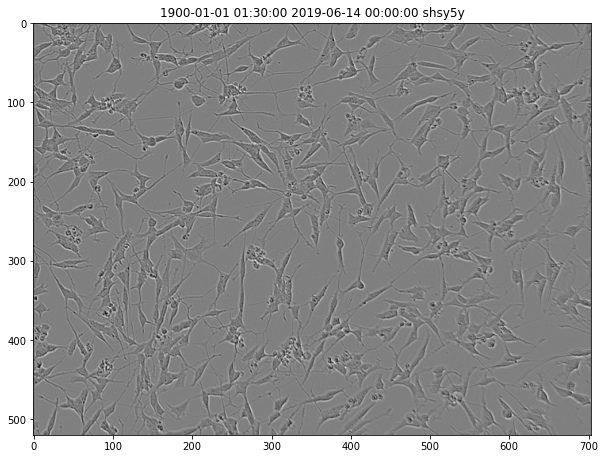

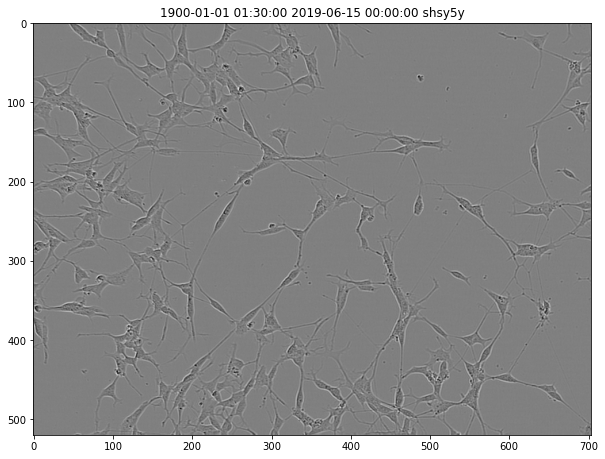

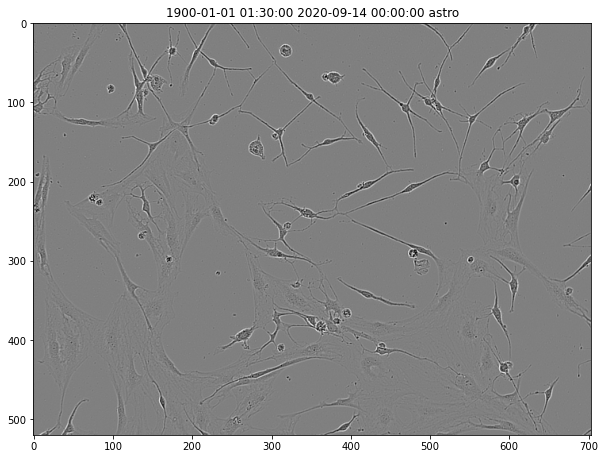

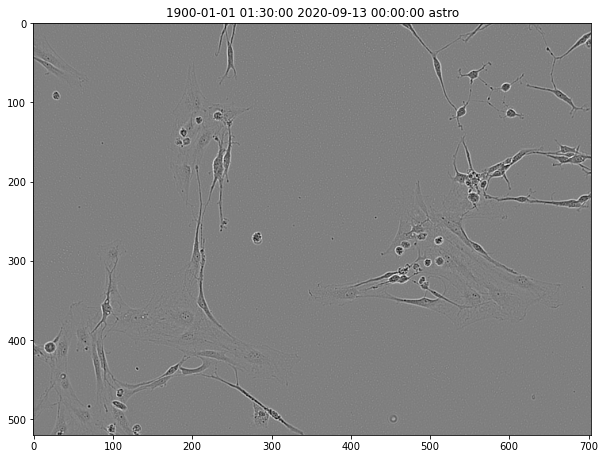

...

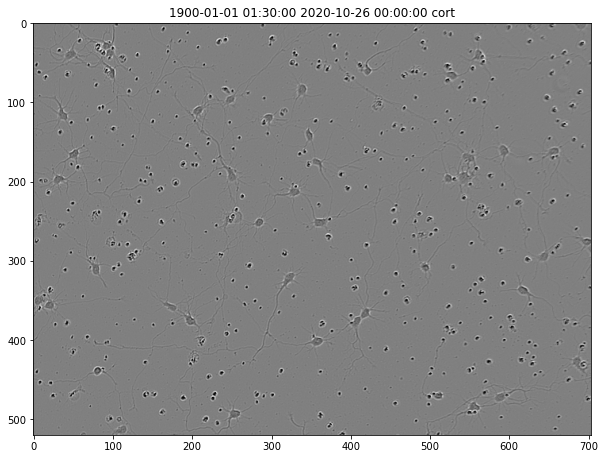

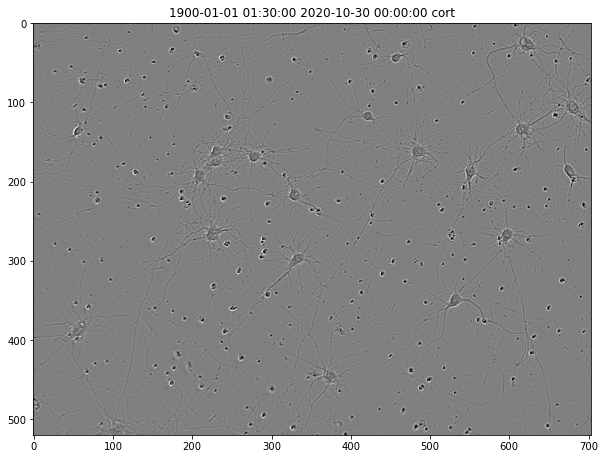

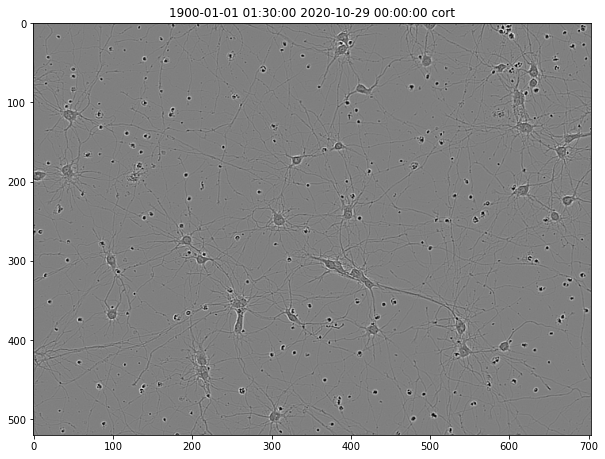

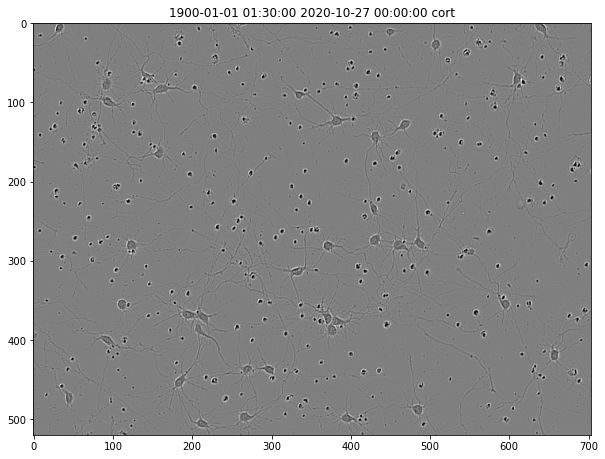

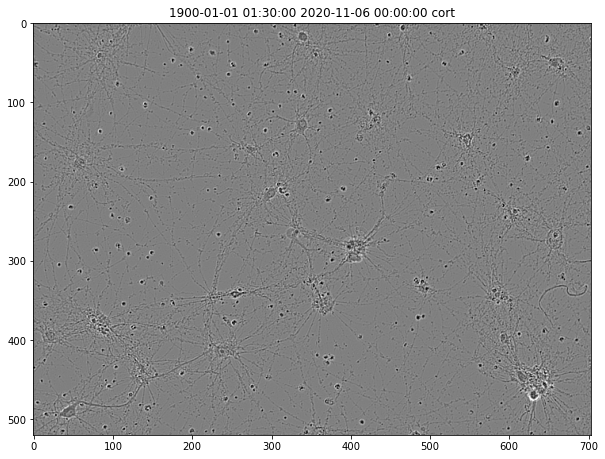

In [83]:
for cell_type in train_df['cell_type'].unique():
    for sample_date in train_df['sample_date'].value_counts().index:
        try:
            values = train_df[(train_df['sample_date'] == sample_date) & (train_df['cell_type'] == cell_type)].sample(1).iloc[0]
        except:
            continue
        img_id = values['id']
        sample_date = values['sample_date']
        img = cv2.imread(f'data/train/{img_id}.png')
        plt.figure(figsize=(10, 10))
        plt.title(f'{plate_time} {sample_date} {cell_type}')
        plt.imshow(img)
        plt.show()

In [95]:
train_df['height'].value_counts()

520    73585
Name: height, dtype: int64

In [96]:
def decode_rle_mask(rle_mask, shape=(520, 704)):

    """
    Decode run-length encoded segmentation mask string into 2d array

    Parameters
    ----------
    rle_mask (str): Run-length encoded segmentation mask string
    shape (tuple): Height and width of the mask

    Returns
    -------
    mask [numpy.ndarray of shape (height, width)]: Decoded 2d segmentation mask
    """

    rle_mask = rle_mask.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (rle_mask[0:][::2], rle_mask[1:][::2])]
    starts -= 1
    ends = starts + lengths

    mask = np.zeros((shape[0] * shape[1]), dtype=np.uint8)
    for start, end in zip(starts, ends):
        mask[start:end] = 1

    mask = mask.reshape(shape[0], shape[1])
    return mask

In [97]:
[np.asarray(x, dtype=int) for x in (train_df.iloc[0]['annotation'].split()[0:][::2], train_df.iloc[0]['annotation'].split()[1:][::2])]

[array([118145, 118849, 119553, 120257, 120961, 121665, 122369, 123074,
        123778, 124482, 125186, 125890, 126594, 127298, 128002, 128706,
        129410, 130114, 130818, 131523, 132227, 132931, 133635, 134339,
        135043, 135748, 136452, 137157, 137864, 138573]),
 array([ 6,  7,  8,  8,  9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
        23, 24, 24, 25, 25, 24, 24, 23, 21, 19, 16, 11,  4])]

In [100]:
def visualize_image(df, image_id):

    """
    Visualize image along with segmentation masks

    Parameters
    ----------
    df [pandas.DataFrame of shape (73585, 9)]: Training dataframe
    image_id (str): Image ID (filename)
    """
    
    image_path = df.loc[df['id'] == image_id, 'id'].values[0]
    cell_type = df.loc[df['id'] == image_id, 'cell_type'].values[0]
    plate_time = df.loc[df['id'] == image_id, 'plate_time'].values[0]
    sample_date = df.loc[df['id'] == image_id, 'sample_date'].values[0]
    sample_id = df.loc[df['id'] == image_id, 'sample_id'].values[0]

    image = cv2.imread(f'data/train/{image_path}.png')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    print(f'{image_id}\n{"-" * len(image_id)}')
    print(f'Image Mean: {np.mean(image):.4f}  -  Median: {np.median(image):.4f}  -  Std: {np.std(image):.4f} - Min: {np.min(image):.4f} -  Max: {np.max(image):.4f}')

    fig, axes = plt.subplots(figsize=(20, 20), ncols=2)
    fig.tight_layout(pad=5.0)
    
    axes[0].imshow(image, cmap='gray')
    masks = []
    for mask in df.loc[df['id'] == image_id, 'annotation'].values:
        decoded_mask = decode_rle_mask(rle_mask=mask, shape=image.shape)
        masks.append(decoded_mask)
    mask = np.stack(masks)
    mask = np.any(mask == 1, axis=0)
    axes[1].imshow(image, cmap='gray')
    axes[1].imshow(mask, alpha=0.4)

    for i in range(2):
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')
        axes[i].tick_params(axis='x', labelsize=15, pad=10)
        axes[i].tick_params(axis='y', labelsize=15, pad=10)
        
    axes[0].set_title(f'{image_path} - {cell_type} - Annotations\n{plate_time} - {sample_date} - {sample_id}', fontsize=20, pad=15)
    axes[1].set_title('Segmentation Mask', fontsize=20, pad=15)
    plt.show()
    plt.close(fig)

fe3e30f849f4
------------
Image Mean: 128.0025  -  Median: 128.0000  -  Std: 12.9703 - Min: 3.0000 -  Max: 255.0000


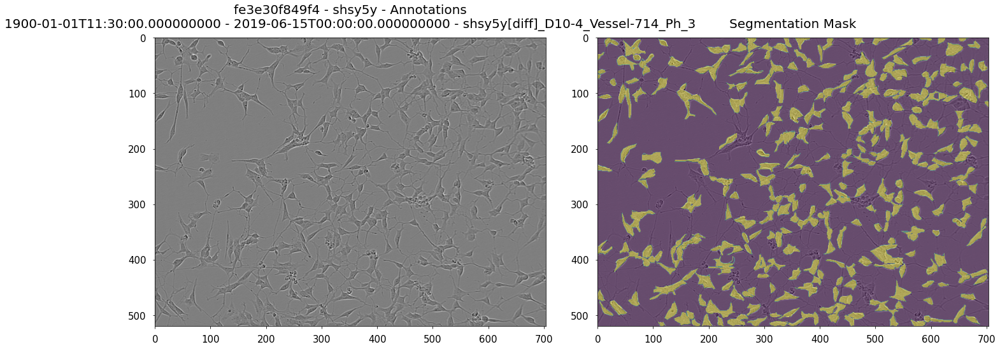

7d357c4f7438
------------
Image Mean: 127.9773  -  Median: 128.0000  -  Std: 7.0435 - Min: 3.0000 -  Max: 255.0000


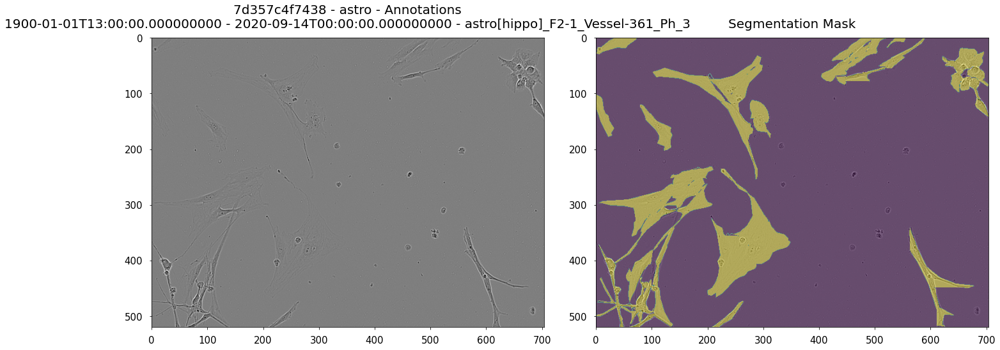

dead8d6e0ea8
------------
Image Mean: 127.8763  -  Median: 129.0000  -  Std: 17.0764 - Min: 3.0000 -  Max: 255.0000


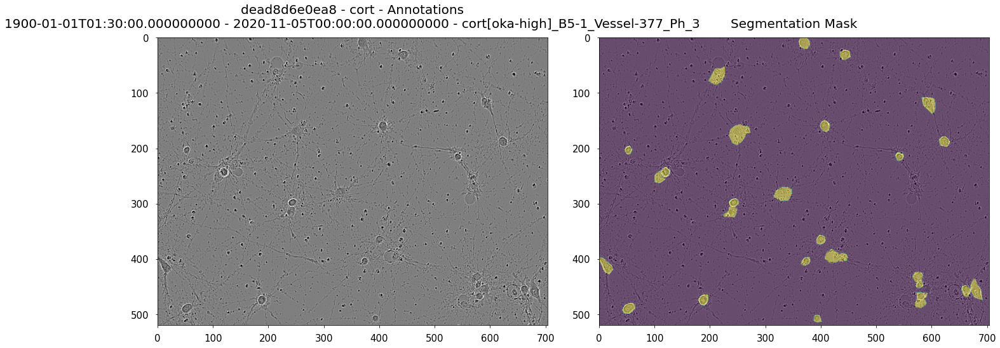

In [102]:
for cell_type in train_df['cell_type'].unique():
    values = train_df[train_df['cell_type'] == cell_type].sample(1).iloc[0]
    img_id = values['id']
    visualize_image(train_df, img_id)

In [103]:
import albumentations as A

In [125]:
def visualize(image, mask, original_image=None, original_mask=None, name_addtion=None):
    fontsize = 18
    
    if original_image is None and original_mask is None:
        f, ax = plt.subplots(2, 1, figsize=(8, 8))

        ax[0].imshow(image)
        ax[1].imshow(mask)
    else:
        f, ax = plt.subplots(2, 2, figsize=(10, 10))
        
        ax[0, 0].imshow(original_image)
        ax[0, 0].set_title('Original image', fontsize=fontsize)
        
        ax[1, 0].imshow(original_mask)
        ax[1, 0].set_title('Original mask', fontsize=fontsize)
        
        ax[0, 1].imshow(image)
        ax[0, 1].set_title('Transformed image', fontsize=fontsize)
        
        ax[1, 1].imshow(mask)
        ax[1, 1].set_title('Transformed mask', fontsize=fontsize)

(520, 704, 3) (520, 704)
(520, 704, 3) (520, 704)
(520, 704, 3) (520, 704)


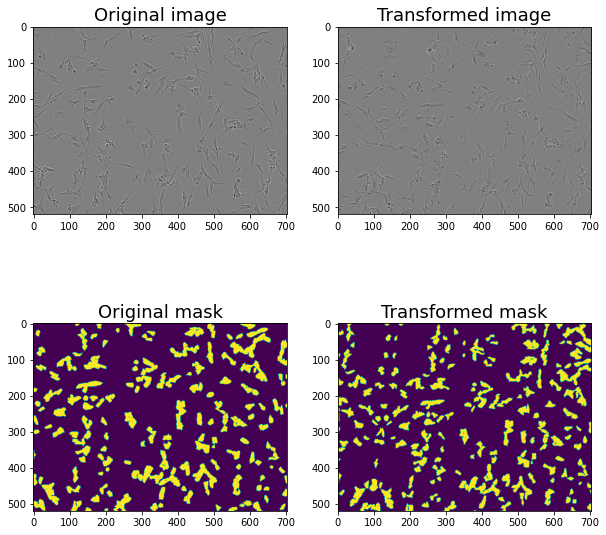

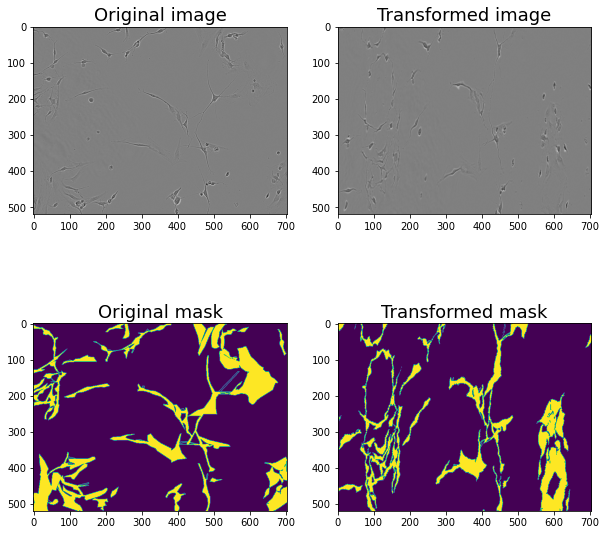

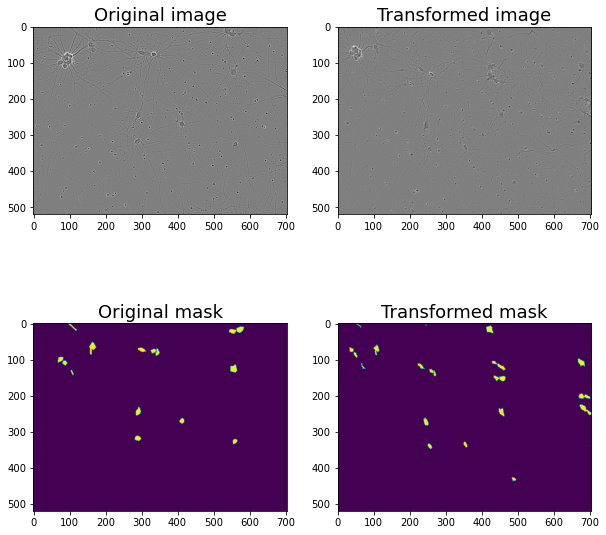

In [129]:
for cell_type in train_df['cell_type'].unique():
    print
    values = train_df[train_df['cell_type'] == cell_type].sample(1).iloc[0]
    img_id = values['id']
    image = cv2.imread(f'data/train/{img_id}.png')
    # image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    masks = []
    for mask in train_df.loc[train_df['id'] == img_id, 'annotation'].values:
        decoded_mask = decode_rle_mask(rle_mask=mask, shape=image.shape)
        masks.append(decoded_mask)
    mask = np.stack(masks)
    mask = np.uint8(np.any(mask == 1, axis=0))
    
    aug = A.ElasticTransform(p=1, alpha=60, sigma=120 * 0.05, alpha_affine=120)

    augmented = aug(image=image, mask=mask)

    image_padded = augmented['image']
    mask_padded = augmented['mask']

    print(image_padded.shape, mask_padded.shape)

    visualize(image_padded, mask_padded, original_image=image, original_mask=mask)

In [128]:
mask.shape

(520, 704)

In [115]:
image.shape

(520, 704, 3)